# ============================================================
# ----------------------------**The Boston House Prices Dataset** -----------------------------
# ============================================================

  
  
<img src=https://media1.tenor.com/images/dba2db454d73c5677a251ae01bd8f0ab/tenor.gif?itemid=9150166 width="800" height= '400' border="">




**The Boston Housing Dataset**

The Boston Housing Dataset is a derived from information collected by the U.S. Census Service concerning housing in the area of Boston MA. This dataset was taken from the StatLib library which is maintained at Carnegie Mellon University.

# Importing libraries

In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
from pandas import DataFrame


#Data Visuaization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as pyo
#allows us to create the Data and Figure objects
from plotly.graph_objs import *
from plotly import figure_factory as FF 
#lets us see the charts in an iPython Notebook
pyo.offline.init_notebook_mode() # run at the start of every ipython 

# for Box-Cox Transformation
from scipy import stats

#Algorithms for regression

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import PolynomialFeatures 
from sklearn import model_selection
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import make_pipeline


#Preprocessing
from sklearn.preprocessing import MinMaxScaler



from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold



In [2]:
#Importing data set from sklearn
from sklearn.datasets import load_boston

data = load_boston()

In [3]:
dataframe = pd.DataFrame(data.data, columns=data.feature_names)

In [4]:
dataframe.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [5]:
# Adding price column to dataframe
dataframe['Price'] = data.target

In [6]:
dataframe.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [7]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
CRIM       506 non-null float64
ZN         506 non-null float64
INDUS      506 non-null float64
CHAS       506 non-null float64
NOX        506 non-null float64
RM         506 non-null float64
AGE        506 non-null float64
DIS        506 non-null float64
RAD        506 non-null float64
TAX        506 non-null float64
PTRATIO    506 non-null float64
B          506 non-null float64
LSTAT      506 non-null float64
Price      506 non-null float64
dtypes: float64(14)
memory usage: 55.4 KB


In [8]:
dataframe.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.593761,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.596783,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.647423,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


From get-go, two data coulmns show interesting summeries. They are : ZN (proportion of residential land zoned for lots over 25,000 sq.ft.) with 0 for 25th, 50th percentiles. Second, CHAS: Charles River dummy variable (1 if tract bounds river; 0 otherwise) with 0 for 25th, 50th and 75th percentiles. These summeries are understandable as both variables are conditional + categorical variables. First assumption would be that these coulms may not be useful in regression task such as predicting MEDV (Median value of owner-occupied homes).

In [9]:
dataframe.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'Price'],
      dtype='object')

In [10]:
#Lets get the list of keys in the dataset
for i,n in enumerate(list(data.keys())):
    
    print("{}. {}".format(i+1,n))

1. data
2. target
3. feature_names
4. DESCR


In [11]:
tabledata = [['ATTRIBUTES','DESCRIPTION'],
             ['1. CRIM','Per capita crime rate by town.'],
             ['2. ZN','Proportion of residential land zoned for lots over 25,000 sq.ft.'],
              ['3. INDUS','Proportion of non-retail business acres per town.'],
              ['4. CHAS', 'Charles River dummy variable (= 1 if tract bounds river; 0 otherwise).'],
             ['5. NOX','Nitric oxides concentration (parts per 10 million).'],
             ['6. RM','Average number of rooms per dwelling.'],
             ['7. AGE','Proportion of owner-occupied units built prior to 1940.'],
             ['8. DIS','Weighted distances to five Boston employment centres.'],
             ['9. RAD','Index of accessibility to radial highways.'],
             ['10. TAX','Full-value property-tax rate per $10,000.'],
            ['11. PTRATIO','Pupil-teacher ratio by town.'],
            ['12. B','1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town.'],
              ['13. LSTAT','% lower status of the population.'],
              ['14. MEDV(Price)',"Median value of owner-occupied homes in $1000's."]]

#making the table of attributes and description using plotly.
house_data_features = FF.create_table(tabledata)

house_data_features['data'][0]['colorscale'] = [[0, "2F4F4F"],
                                 [0.5, "B0C4DE"],
                                 [1, "#ffffff"]]


# *Boston House Prices Dataset*
**The following describes the dataset columns:**

In [12]:
pyo.iplot(house_data_features)

In [13]:
house_data = FF.create_table(dataframe, index = True)
pyo.iplot(house_data)

## Data Analysis

At first lets try to feature correlation between different features.

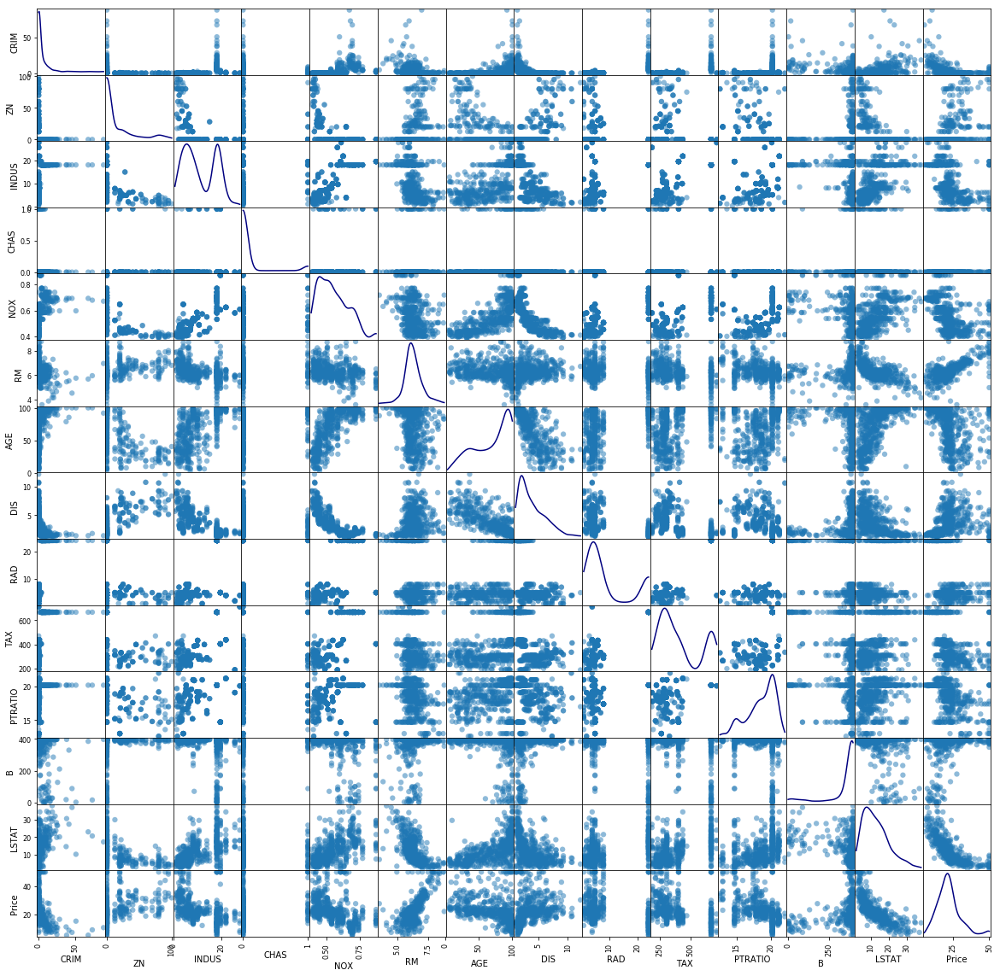

In [14]:
# plotting a scatter matrix
from matplotlib import cm

X = dataframe[['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT']]
Y= dataframe['Price']
X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=0)

cmap = cm.get_cmap('gnuplot')
scatter = pd.plotting.scatter_matrix(dataframe, marker = 'o', s=40, hist_kwds={'bins':15},density_kwds  ={'color': 'Navy'}, diagonal = 'kde', figsize=(20,20), cmap=cmap)

Above pairwise scatter plot shows that feature **CHAS** doesn't show any variation with changing values of price also feature **ZN** shows only small amount of values changes to with variation in values of **Price**, hence these features are going to contributee ngligibly in price prediction. Also features thsoe are highly correlated(those are having scatter plot densely aggregated in a small region) the features those are not correlated are having their spreaded scatter plot. Now I'm plotting heatmap for feature correlation.

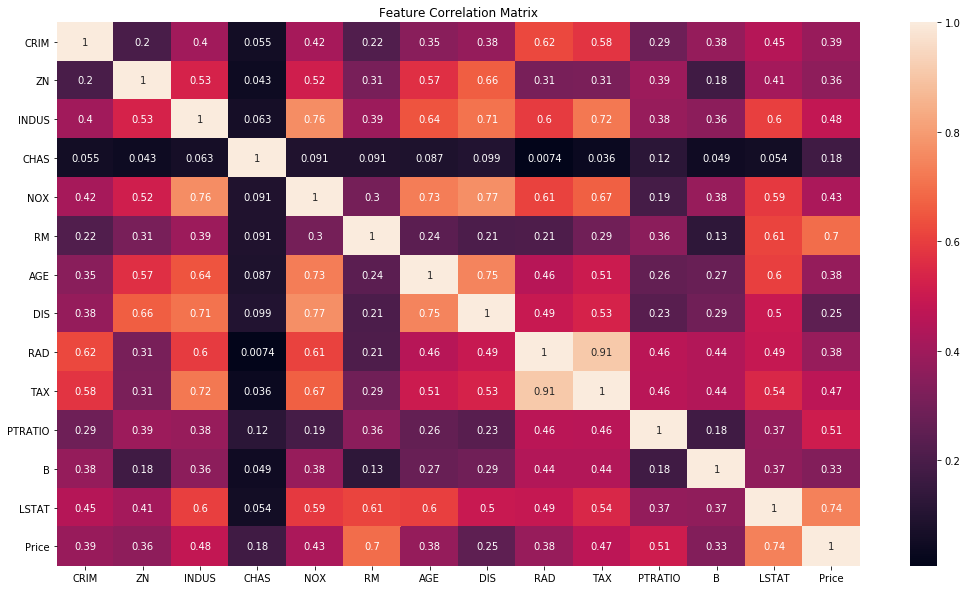

In [15]:
plt.figure(figsize=(18, 10))
sns.heatmap(dataframe.corr().abs(),  annot=True)
plt.title('Feature Correlation Matrix');

Above correlation matrix shows that features **TAX** and **RAD** are highly correlated having correlation values 0.9. Also features such as **LSTAT** and and **RM** have correlation values above .50 with **Price**, which is indicates that these features are most important for price prediction as well as features such as **CRIM**, **INDUS**, **NOX** and **PTRATIO** are having values close to .50 hence they are also important ones in **Price** prediction.

To see linear relation between **Price** and features having high correlation with the **Price** I'm going to plot there joint plots  with **Price** while taking correlation parameter pearson.   

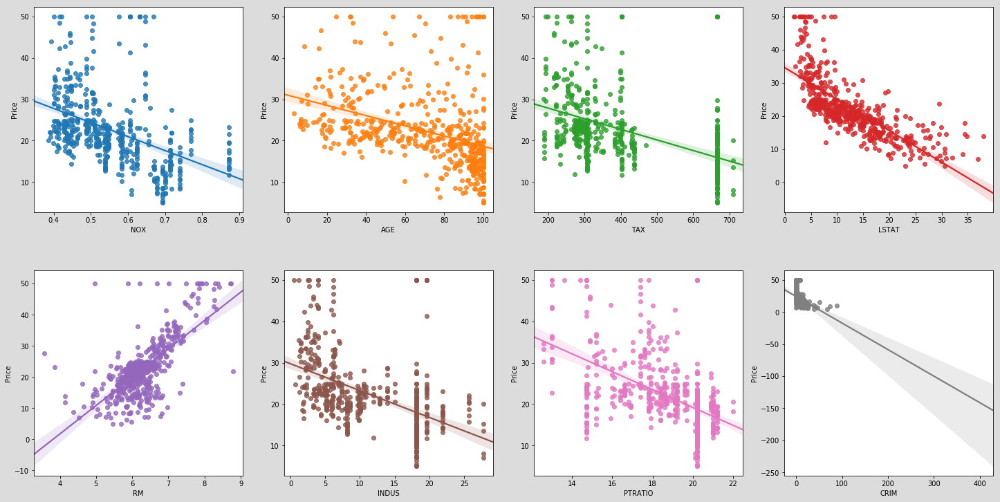

In [16]:
corre = ['NOX',  'AGE','TAX', 'LSTAT' , 'RM', 'INDUS', 'PTRATIO', 'CRIM']
fig, axes = plt.subplots(2, 4, facecolor='gainsboro', figsize=(20, 10))
axs = axes.flatten()

x = dataframe.loc[:,corre]
y = dataframe['Price']
#index = 0
features = corre + ['Price']
for i, k in enumerate(corre):
    sns.regplot(x = x[k], y =y, ax = axs[i])
    
    
    #g = sns.jointplot("total_bill", "tip", data=tips, kind="reg")


plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)




Features **LSTAT**(% lower status of the population.) and **RM**(Average number of rooms per dwelling/House.) have almost linear relatonship with **Price** of home.

Hence, we can conclude that average no. of rooms per house and percentage of the lower status of population in area have direct influence on the price of houses.

In [17]:

Y.head()

0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: Price, dtype: float64

In [18]:
features = list(data.feature_names)
print('{}'.format(features[1]))
features

ZN


['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

Now let's try to find features having possible outliners

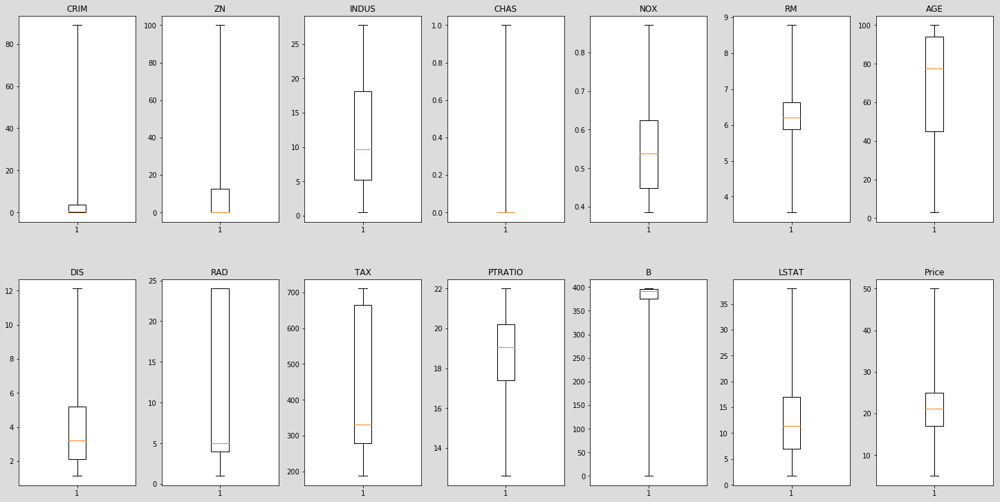

In [19]:
fig, axes = plt.subplots(2, 7, facecolor='gainsboro', figsize=(20, 10))
axs = axes.flatten()
index = 0
features = list(data.feature_names) + ['Price']
for i in range(len(axes.flatten())):
    axs[i].boxplot(dataframe['{}'.format(features[i])], whis = 'range')
    axs[i].set_title('{}'.format(features[i]))


plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

Features **CRIM**, **ZN**, **B**, **RM**, **PTRATIO** and **LSTAT** are having outliners

Now, looking at distribution of values of features

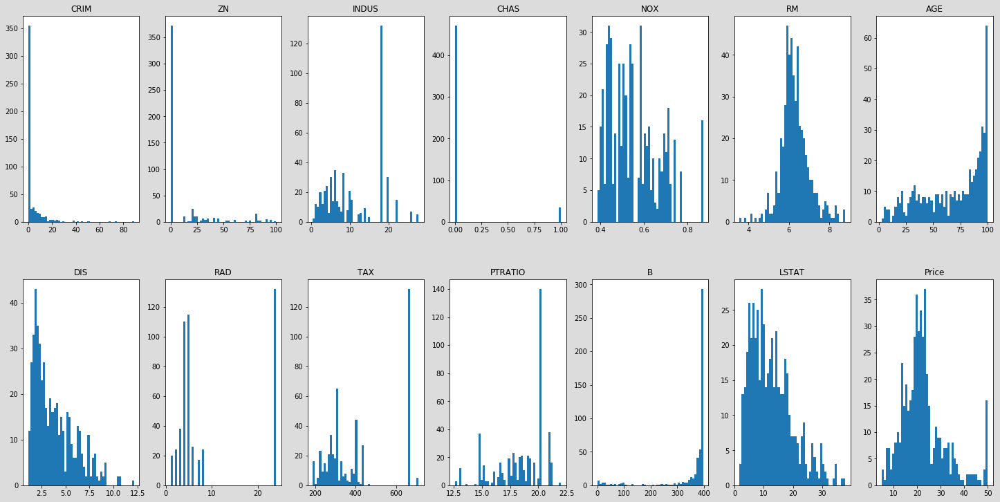

In [20]:
fig, axes = plt.subplots(2, 7, facecolor='gainsboro', figsize=(20, 10))
axs = axes.flatten()
index = 0
features = list(data.feature_names) + ['Price']
for i in range(len(axes.flatten())):
    axs[i].hist(dataframe['{}'.format(features[i])], bins = 50)
    axs[i].set_title('{}'.format(features[i]))
    


plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

Distribution of data is not normal and has highly skewed distributions in many features such as **CRIM**, **ZN**, **RAD**,**B**  etc.

To remove outliners and to normalize(since i'm also going to apply linear regression and gussian naive bayes ml algorithms) data So, I will take log transform of data.

Now let's see the variation of features with price those are having high correlation.

# Data Munging

Taking log will give error so avoid it

In [21]:
#Taking log of features can't do for 'ZN' since it also have zero value.
Outline = ['CRIM',  'B', 'RM', 'LSTAT', 'PTRATIO']
for i in range(len(Outline)):
    dataframe['{}'.format(Outline[i])] = np.log(dataframe['{}'.format(Outline[i])] +1)


## Machine Learning  Models

## Scores of Linear Models

- Linear Regression
- Linear Regression with Ridge Regression
- Lasso Regression 
- Polynomial Regression.

In [22]:
predictors = ['NOX',  'AGE','TAX', 'LSTAT' , 'RM', 'INDUS', 'PTRATIO', 'CRIM', 'DIS', 'AGE']

X = dataframe[predictors]
Y = dataframe.Price

In [23]:

# Linear regression Model 
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
kf = KFold(n_splits= 5)
scores = cross_val_score(LinearRegression(), X_scaled, Y, cv= kf , scoring='neg_mean_squared_error')

print("MSE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))


# Ridge Regression Model
scores_R = cross_val_score(Ridge(), X_scaled, Y, cv= kf , scoring='neg_mean_squared_error')
print("MSE: %0.2f (+/- %0.2f)" % (scores_R.mean(), scores_R.std()))


# Lasso Regression Model
scores_L = cross_val_score(Lasso(), X_scaled, Y, cv= kf , scoring='neg_mean_squared_error')
print("MSE: %0.2f (+/- %0.2f)" % (scores_L.mean(), scores_L.std()))


# Lets try polinomial regression with L2 with degree = 3, for the best fit

from sklearn.preprocessing import PolynomialFeatures
model = make_pipeline(PolynomialFeatures(degree=3), linear_model.Ridge())
scores_P = cross_val_score(model, X_scaled, Y, cv=kf, scoring='neg_mean_squared_error')

print("MSE: %0.2f (+/- %0.2f)" % (scores_P.mean(), scores_P.std()))

MSE: -30.13 (+/- 18.70)
MSE: -27.96 (+/- 16.40)
MSE: -64.40 (+/- 33.36)


NameError: name 'linear_model' is not defined

In [24]:


svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.1)
#grid_sv = GridSearchCV(svr_rbf, cv=kf, param_grid={"C": [1e0, 1e1, 1e2, 1e3], "gamma": np.logspace(-2, 2, 5)}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)

scores_S = cross_val_score(svr_rbf, X_scaled, Y, cv=kf, scoring='neg_mean_squared_error')

print("MSE: %0.2f (+/- %0.2f)" % (scores_S.mean(), scores_S.std()))

MSE: -18.48 (+/- 12.30)


In [25]:


scores_D = cross_val_score(DecisionTreeRegressor(max_depth=5), X_scaled, Y, cv=kf, scoring='neg_mean_squared_error')
#grid_sv = GridSearchCV(desc_tr, cv=kf, param_grid={"max_depth" : [1, 2, 3, 4, 5, 6, 7]}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)

print("MSE: %0.2f (+/- %0.2f)" % (scores_D.mean(), scores_D.std()))

MSE: -41.44 (+/- 22.56)


In [26]:
knn = KNeighborsRegressor(n_neighbors=7)
#grid_sv = GridSearchCV(knn, cv=kf, param_grid={"n_neighbors" : [2, 3, 4, 5, 6, 7]}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
scores_K = cross_val_score(knn, X_scaled, Y, cv=kf, scoring='neg_mean_squared_error')
print("MSE: %0.2f (+/- %0.2f)" % (scores_K.mean(), scores_K.std()))

MSE: -34.13 (+/- 16.73)


In [27]:
gbr = GradientBoostingRegressor(alpha=0.9,learning_rate=0.05, max_depth=2, min_samples_leaf=5, min_samples_split=2, n_estimators=100, random_state=30)
#param_grid={'n_estimators':[100, 200], 'learning_rate': [0.1,0.05,0.02], 'max_depth':[2, 4,6], 'min_samples_leaf':[3,5,9]}
#grid_sv = GridSearchCV(gbr, cv=kf, param_grid=param_grid, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
scores_G = cross_val_score(gbr, X_scaled, Y, cv=kf, scoring='neg_mean_squared_error')

print("MSE: %0.2f (+/- %0.2f)" % (scores_G.mean(), scores_G.std()))

MSE: -19.78 (+/- 13.59)
